<a href="https://colab.research.google.com/github/gautamHCSCV/Image-Classification-on-Edges/blob/main/Sample_image_conversions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Edge Detection

In [ ]:
!sudo apt-get install libopencv-dev python-opencv

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libopencv-dev is already the newest version (3.2.0+dfsg-4ubuntu0.1).
The following NEW packages will be installed:
  python-opencv
0 upgraded, 1 newly installed, 0 to remove and 37 not upgraded.
Need to get 535 kB of archives.
After this operation, 2,944 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 python-opencv amd64 3.2.0+dfsg-4ubuntu0.1 [535 kB]
Fetched 535 kB in 2s (316 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Select

In [ ]:
!bash install-opencv.sh

bash: install-opencv.sh: No such file or directory


In [ ]:
import tensorflow as tf
import keras
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
print(tf.__version__)

2.6.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Actual Image


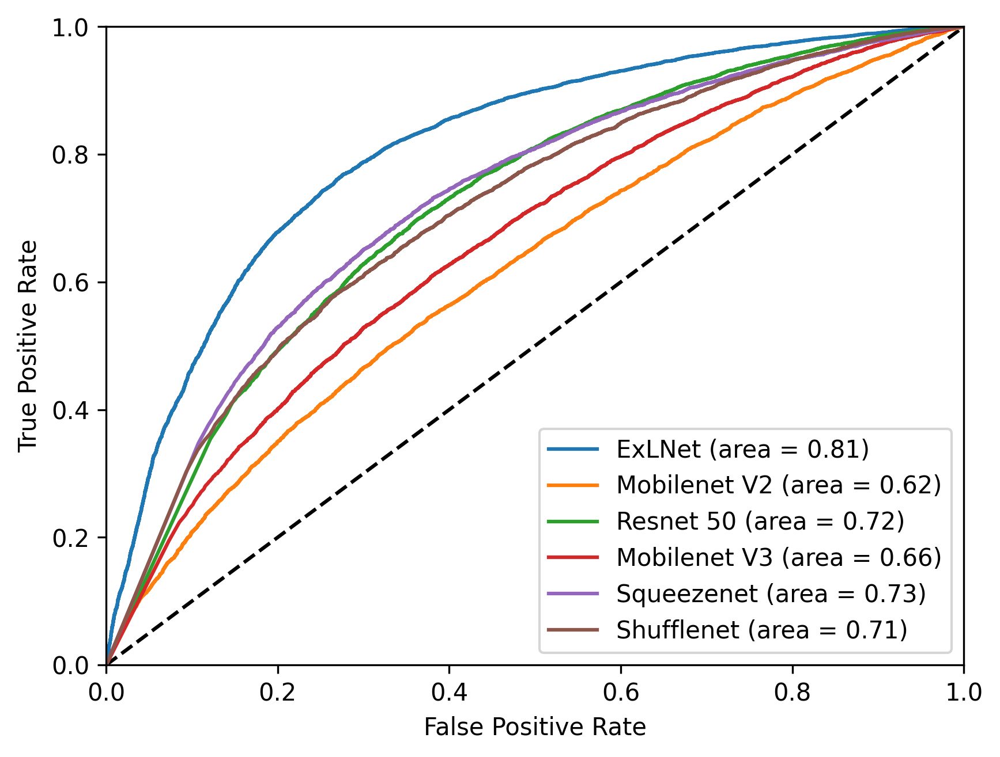

sobel along x


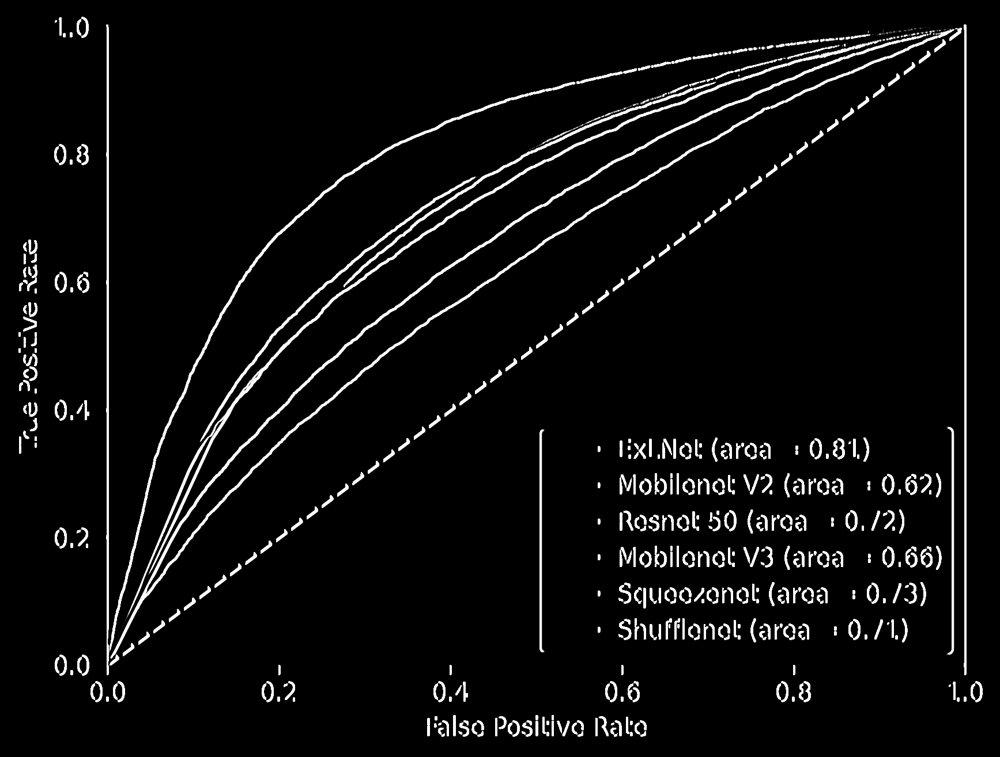

sobel along y


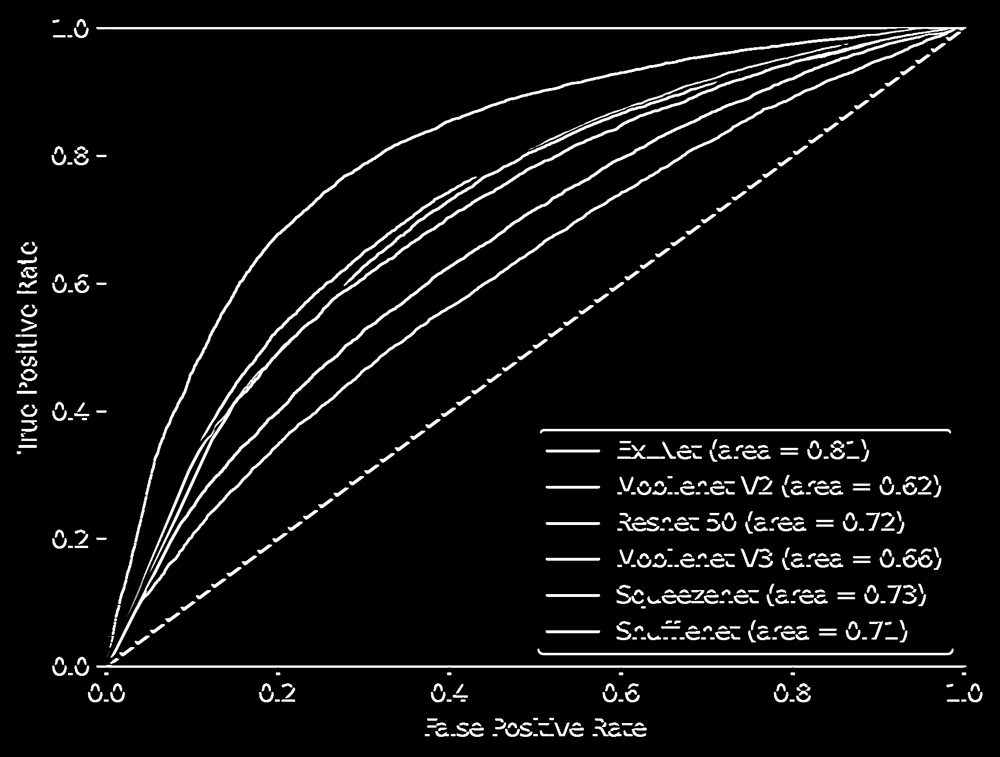

sobel along xy


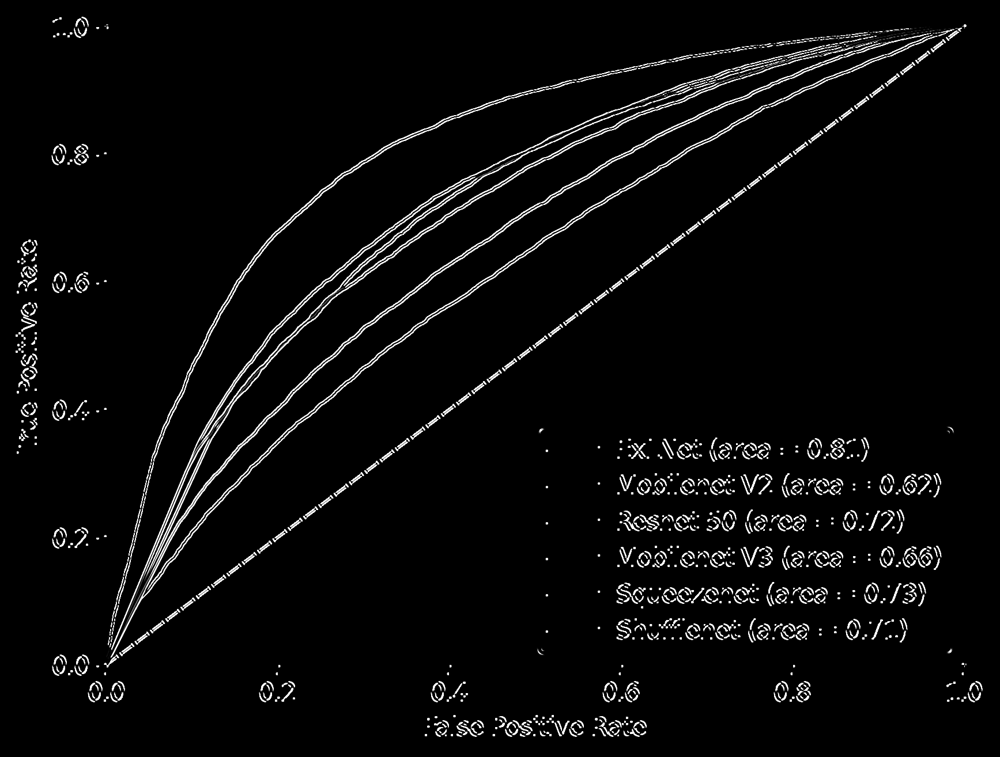

-1

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

image = cv2.imread("/content/stanford_roc.png")
img_blur = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

print('Actual Image')
cv2_imshow(image)
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
print('sobel along x')
cv2_imshow(sobelx)
cv2.waitKey(0)
print('sobel along y')
cv2_imshow(sobely)
cv2.waitKey(0)
print('sobel along xy')
cv2_imshow(sobelxy)
cv2.waitKey(0)


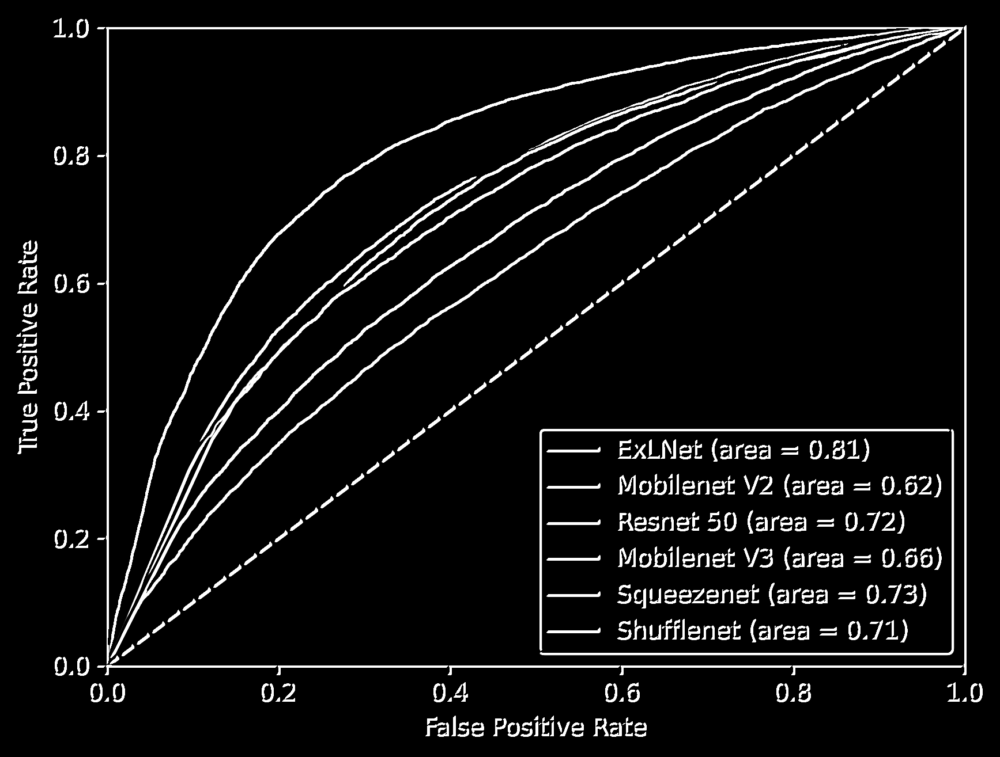

In [ ]:
cv2_imshow(sobelx+sobely)

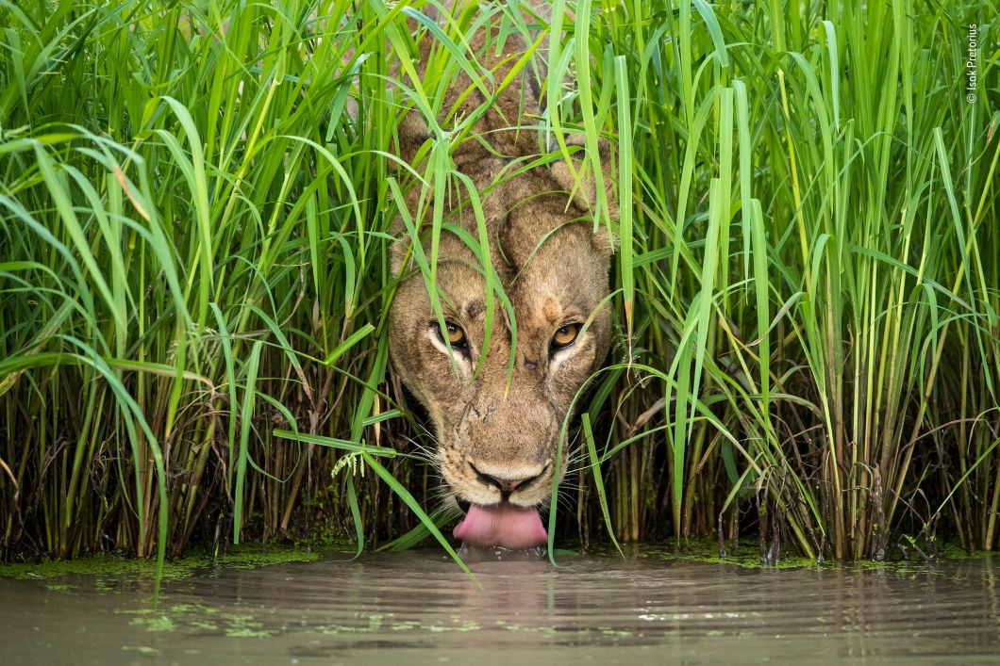

sobel x


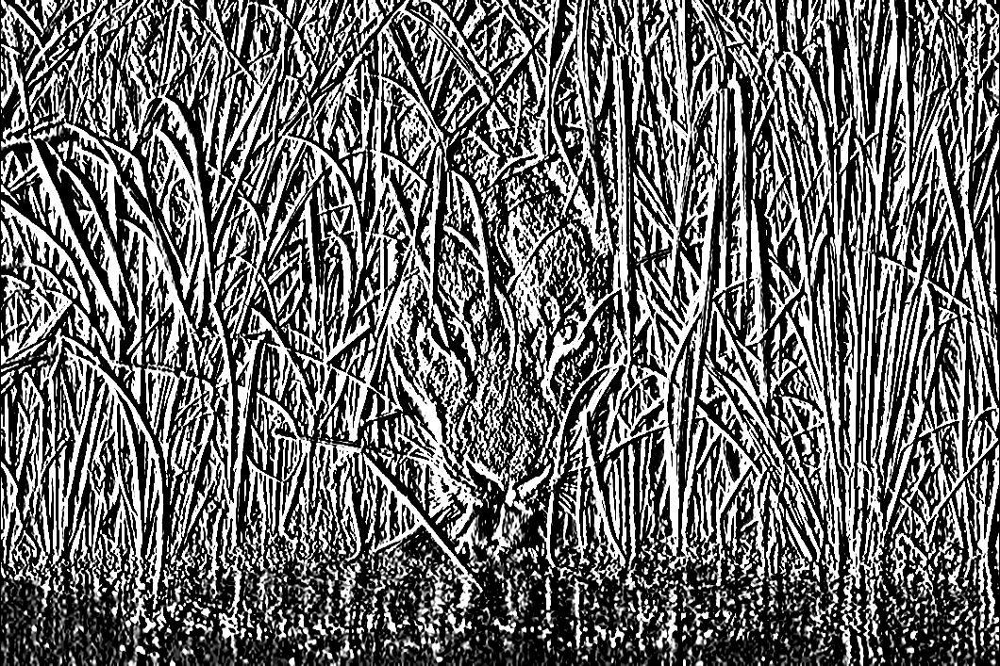

sobel y


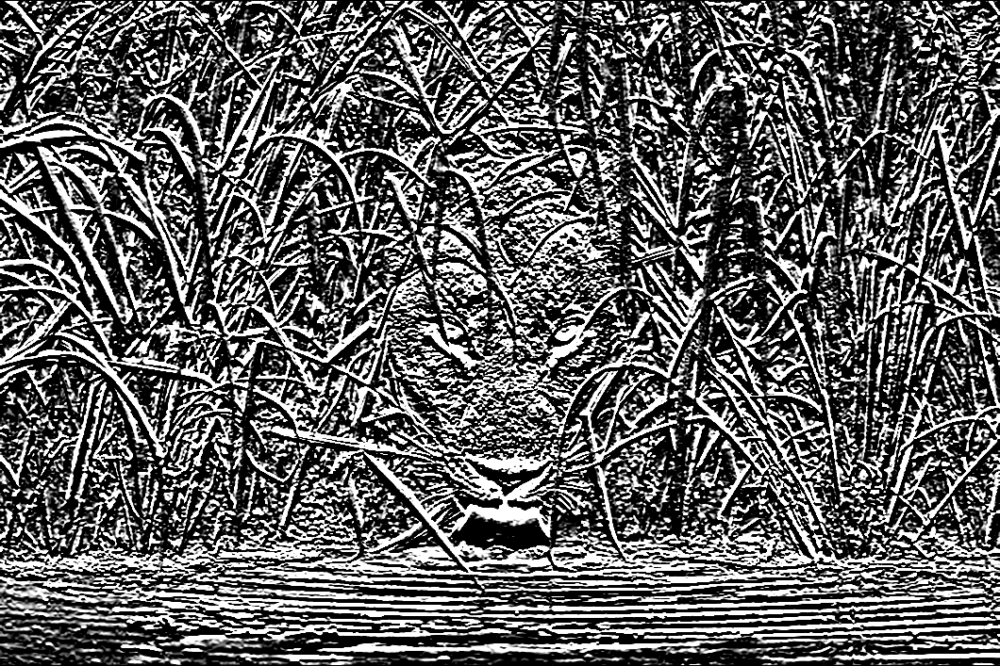

sobel xy


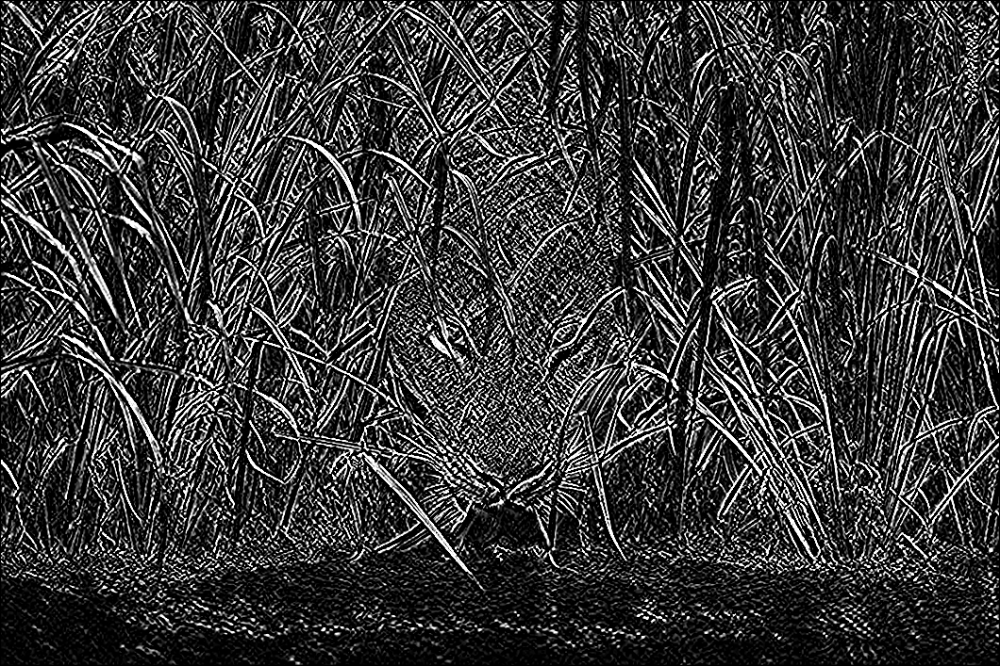

-1

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
path = "/content/drive/MyDrive/cool_cat.jpg"
image = cv2.imread(path)
img_blur = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv2_imshow(image)
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
print('sobel x')
cv2_imshow(sobelx)
cv2.waitKey(0)
print('sobel y')
cv2_imshow(sobely)
cv2.waitKey(0)
print('sobel xy')
cv2_imshow(sobelxy)
cv2.waitKey(0)

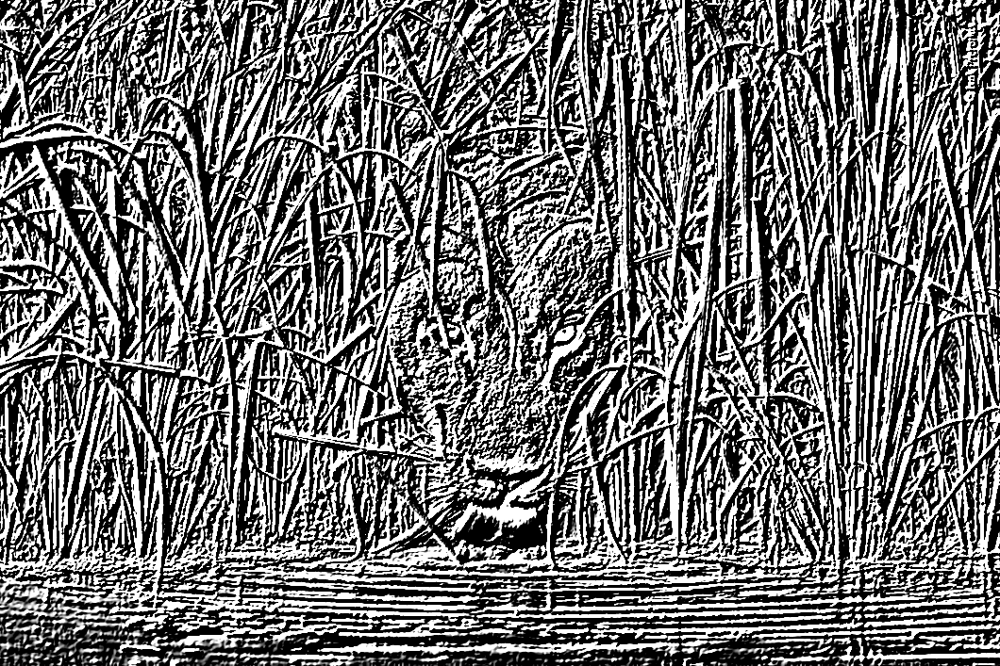

In [ ]:
cv2_imshow(sobelx+sobely)

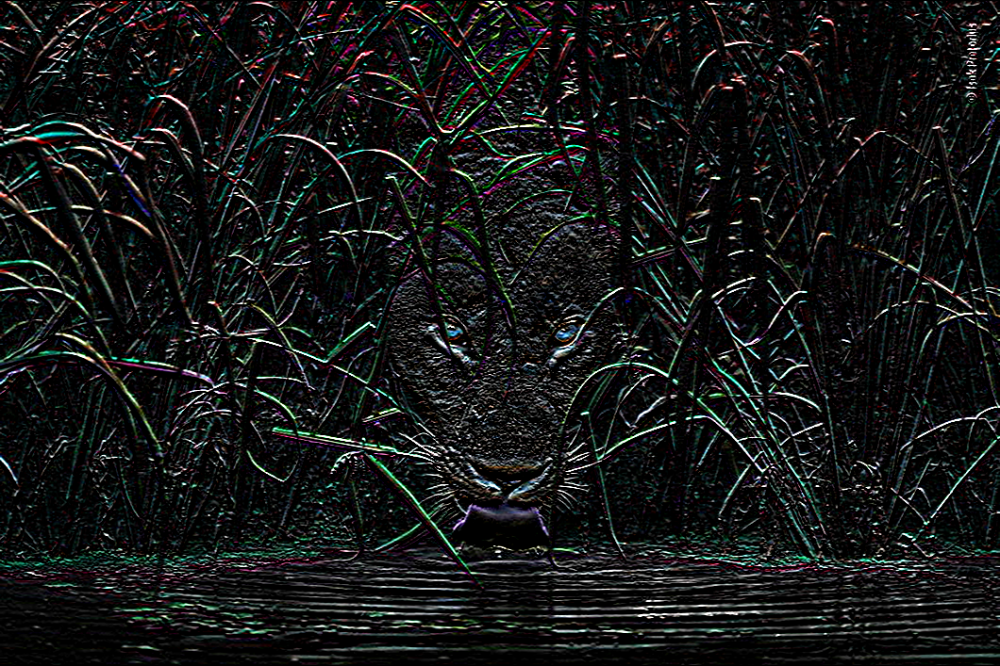

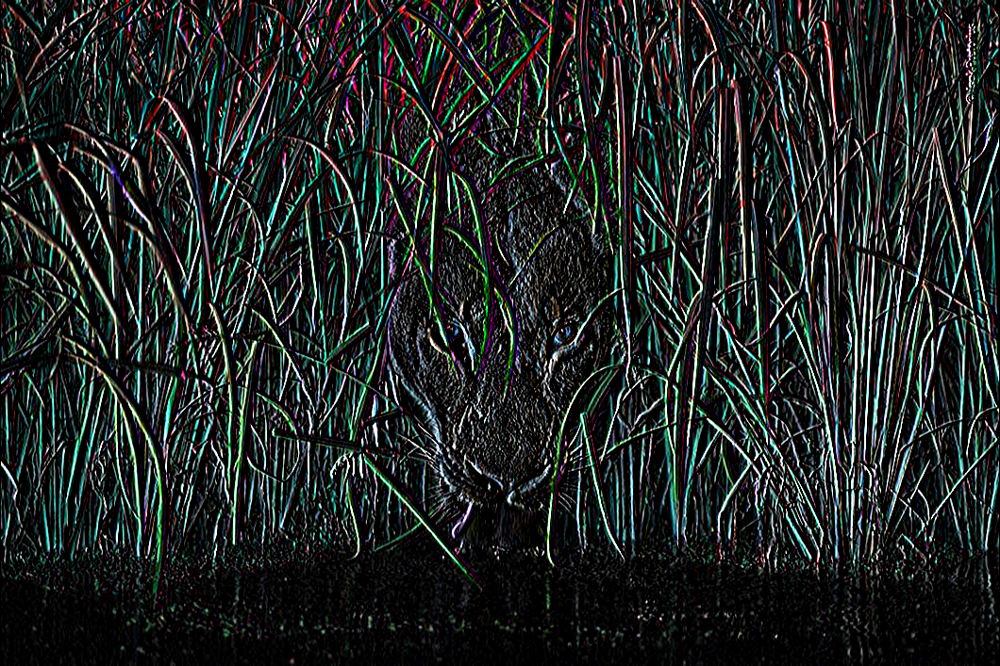

In [30]:
image_bytes = tf.io.read_file(path)
image = tf.image.decode_image(image_bytes)
image = tf.cast(image, tf.float32)
image = tf.expand_dims(image, 0)
sobel = tf.image.sobel_edges(image)
sobel_y = np.asarray(sobel[0, :, :, :, 0]) # sobel in y-direction
sobel_x = np.asarray(sobel[0, :, :, :, 1]) # sobel in x-direction

cv2_imshow(sobel_y)
cv2_imshow(sobel_x)

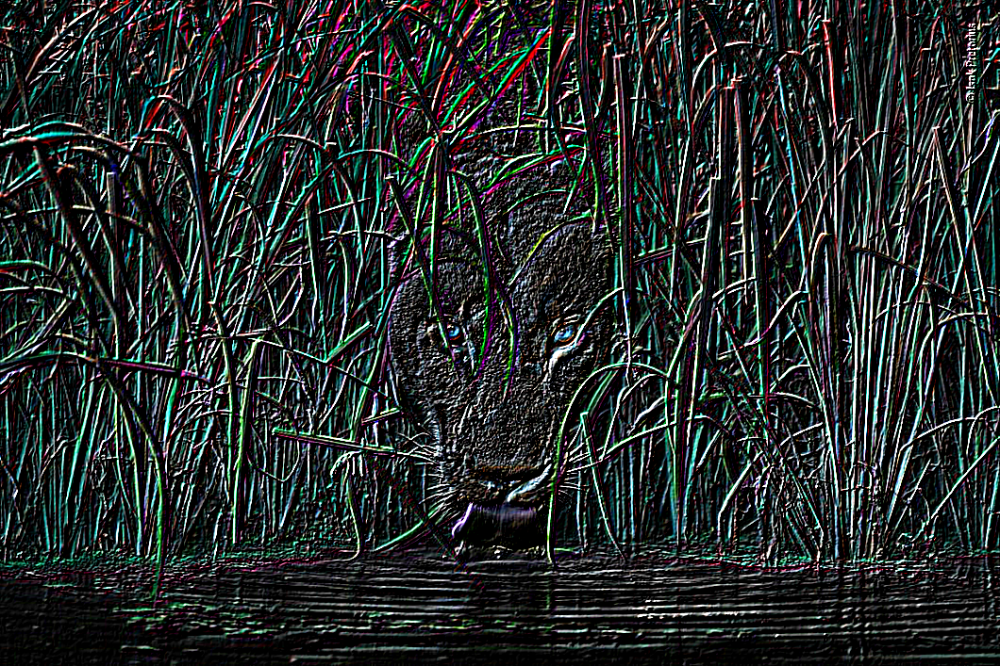

In [31]:
cv2_imshow(sobel_x+sobel_y)

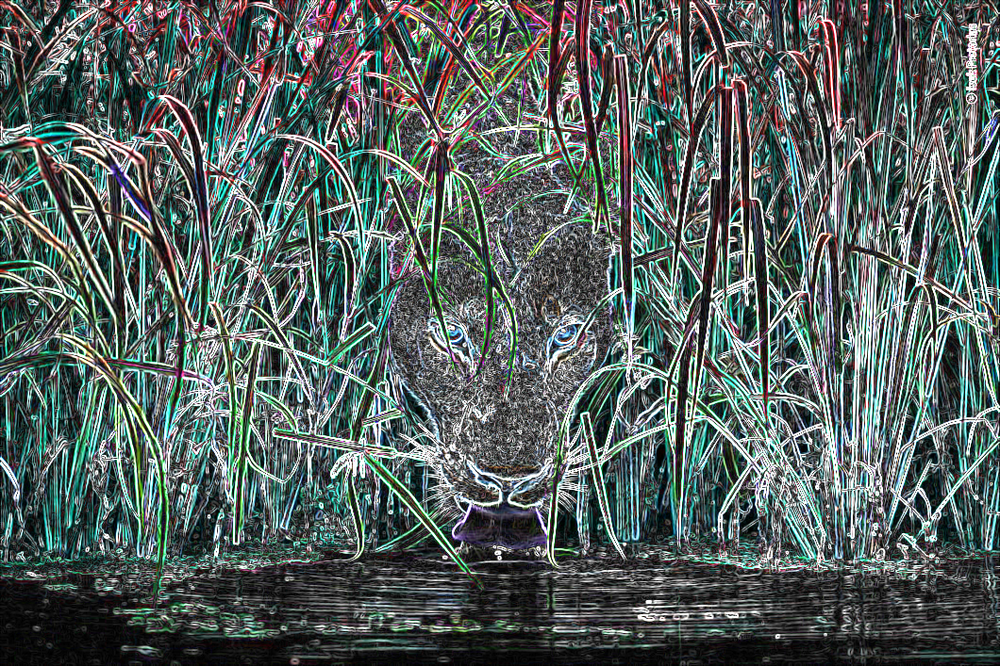

In [33]:
val = tf.sqrt(tf.square(sobel[0,:,:,:,1])+tf.square(sobel[0,:,:,:,0]))
cv2_imshow(np.asarray(val))